In [1]:
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
from path import Path
import cv2
from easydict import EasyDict as edict
import json
import os
from PIL import Image
%reload_ext autoreload
%autoreload 2

In [12]:
a = torch.ones(5, 2)
b = torch.zeros(5, 2)
weights = torch.ones(5, 1)
weights[1] = 5
numerator = 2 * (a * b).sum(-1)
denominator = a.sum(-1) + b.sum(-1)
(1 - (numerator + 1) / (denominator + 1)) * weights.squeeze()

tensor([0.6667, 3.3333, 0.6667, 0.6667, 0.6667])

In [8]:
a = torch.ones(5, 2)
b = torch.zeros(5, 2)
weights = torch.ones(5, 1)
weights[1] = math.sqrt(5)
a = a * weights
b = b * weights
F.binary_cross_entropy_with_logits(a, b, weights, reduction='none')

tensor([[1.3133, 1.3133],
        [5.2271, 5.2271],
        [1.3133, 1.3133],
        [1.3133, 1.3133],
        [1.3133, 1.3133]])

In [102]:
img = np.load('img.npy')
gtclasses = np.load('gt_classes.npy')
gtmasks = np.load('gt_masks.npy')

In [103]:
gtclasses

array([ 2,  3,  6,  9, 13, 15, 17, 19, 19, 24, 27, 29, 30, 35, 45, 45, 45,
       45, 45, 45, 45, 47, 47, 47, 47, 47, 47, 47, 48, 48, 48, 48, 48, 48,
       48, 48, 49, 49, 50, 50, 50, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55,
       55, 55, 55, 55, 55, 55])

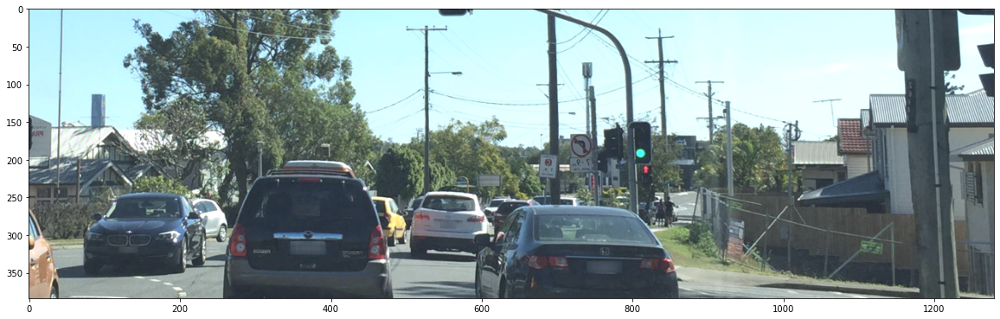

In [104]:
plt.figure(figsize=(20, 20))
plt.imshow(img.transpose(1, 2, 0))

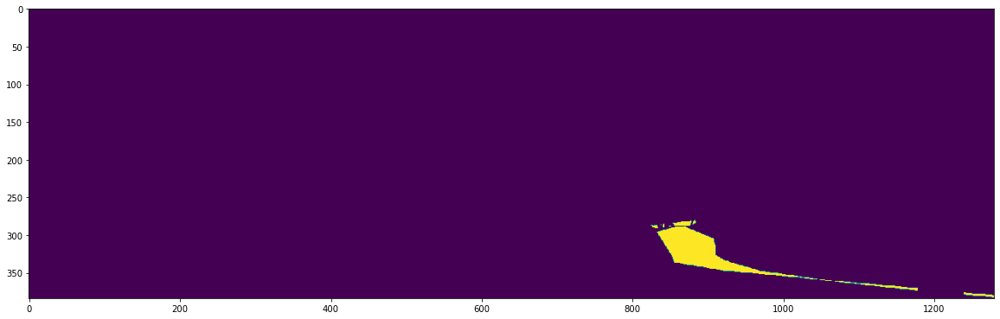

In [116]:
plt.figure(figsize=(20, 20))
# plt.imshow(gtmasks[7:9].sum(axis=0))
plt.imshow(gtmasks[11])

In [14]:
gtmasks.sum(-1).sum(-1)

array([     0,      0,      0,      0,      0,      0, 122723,      0,
            0,      0, 202973,      0, 160356,      0,      0,      0,
            0,      0,      0,      0,      0,   1549,   1423,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,   2496,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
            0,      0])

In [11]:
gtmasks.shape

(82, 384, 1280)

In [2]:
mv_train = '/home/junwen/Datasets/Mapillary_Vistas/1.2/training'
js = os.path.join(mv_train, 'panoptic', 'panoptic_2018.json')
with open(js) as j:
    js = json.load(j)

In [3]:
js['annotations'][0]['segments_info']

[{'area': 52387,
  'category_id': 3,
  'iscrowd': 0,
  'id': 4409415,
  'bbox': [0, 1838, 3264, 525]},
 {'area': 24097,
  'category_id': 4,
  'iscrowd': 0,
  'id': 4018247,
  'bbox': [0, 1675, 985, 97]},
 {'area': 1999,
  'category_id': 10,
  'iscrowd': 0,
  'id': 5198926,
  'bbox': [0, 1900, 814, 165]},
 {'area': 1547274,
  'category_id': 14,
  'iscrowd': 0,
  'id': 5658447,
  'bbox': [0, 1761, 3264, 687]},
 {'area': 160577,
  'category_id': 16,
  'iscrowd': 0,
  'id': 5462874,
  'bbox': [0, 1841, 3264, 469]},
 {'area': 37821,
  'category_id': 18,
  'iscrowd': 0,
  'id': 5263179,
  'bbox': [241, 1426, 1247, 263]},
 {'area': 33971,
  'category_id': 25,
  'iscrowd': 0,
  'id': 6975853,
  'bbox': [0, 1842, 1585, 606]},
 {'area': 2804325,
  'category_id': 28,
  'iscrowd': 0,
  'id': 16438432,
  'bbox': [0, 0, 2478, 1542]},
 {'area': 141884,
  'category_id': 30,
  'iscrowd': 0,
  'id': 2110762,
  'bbox': [2207, 1786, 1057, 312]},
 {'area': 3036133,
  'category_id': 31,
  'iscrowd': 0,
  'i

In [25]:
for ann in js['annotations']:
    image_file = os.path.join(mv_train, 'images', os.path.splitext(ann["file_name"])[0] + ".jpg")
    label_file = os.path.join(mv_train, 'panoptic', ann["file_name"])
    print(image_file, label_file)
    break

/home/junwen/Datasets/Mapillary_Vistas/1.2/training/images/--NSVcUgfVhFd6uzkqHOOg.jpg /home/junwen/Datasets/Mapillary_Vistas/1.2/training/panoptic/--NSVcUgfVhFd6uzkqHOOg.png


In [26]:
img = np.array(Image.open(image_file))
img.shape

(2448, 3264, 3)

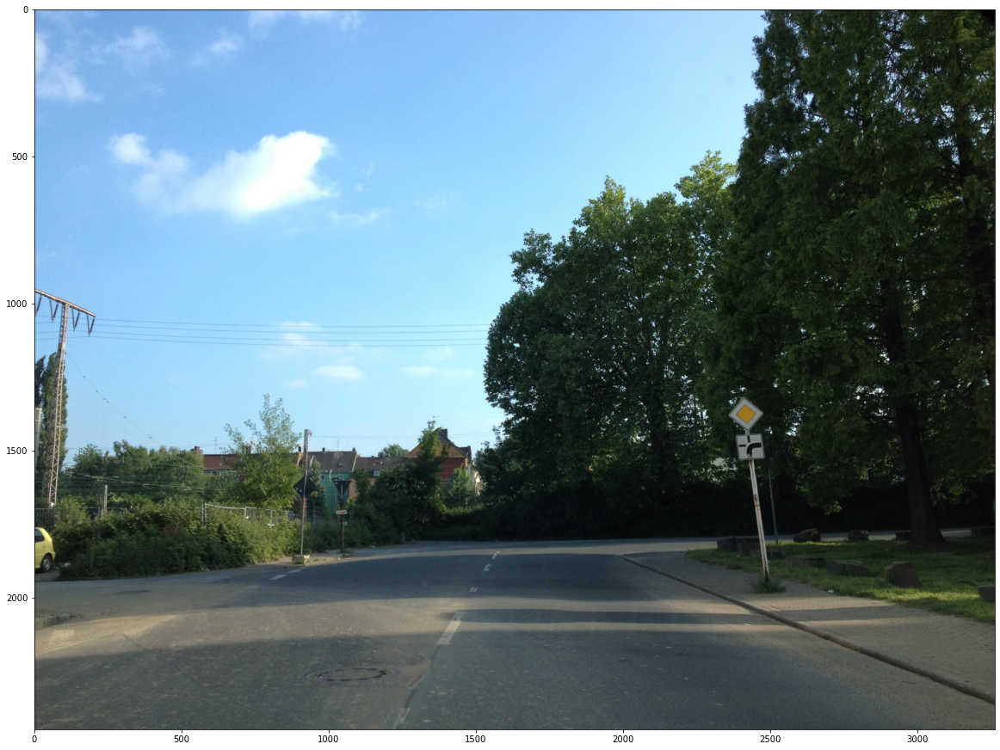

In [27]:
plt.figure(figsize=(20, 20))
plt.imshow(img)

In [28]:
pan = np.array(Image.open(label_file)).astype(np.uint32)
pan = pan[:, :, 0] + (2**8)*pan[:, :, 1] + (2**16)*pan[:, :, 2]
np.unique(pan)

array([       0,  2110762,  2305313,  2368542,  2762269,  2763814,
        2958874,  3554869,  4018247,  4409415,  5067072,  5076340,
        5132101,  5198926,  5263179,  5462874,  5592399,  5658447,
        5726043,  5862778,  6382170,  6582637,  6647148,  6712683,
        6975853,  7039846,  8092276,  8094332, 15324849, 16438432],
      dtype=uint32)

In [16]:
from panopticapi.utils import rgb2id
pan = rgb2id(pan)

ValueError: invalid literal for int() with base 10: '/hhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhh

In [29]:
img = np.load('data/semkitti_dvps/image.npy')
a = np.load('data/semkitti_dvps/vps_seg_gt.npy')
np.unique(a)

array([ 12000,  13000,  14000,  16000, 255000], dtype=int32)

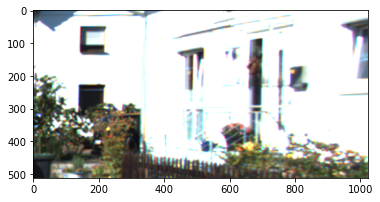

In [30]:
plt.imshow(img)

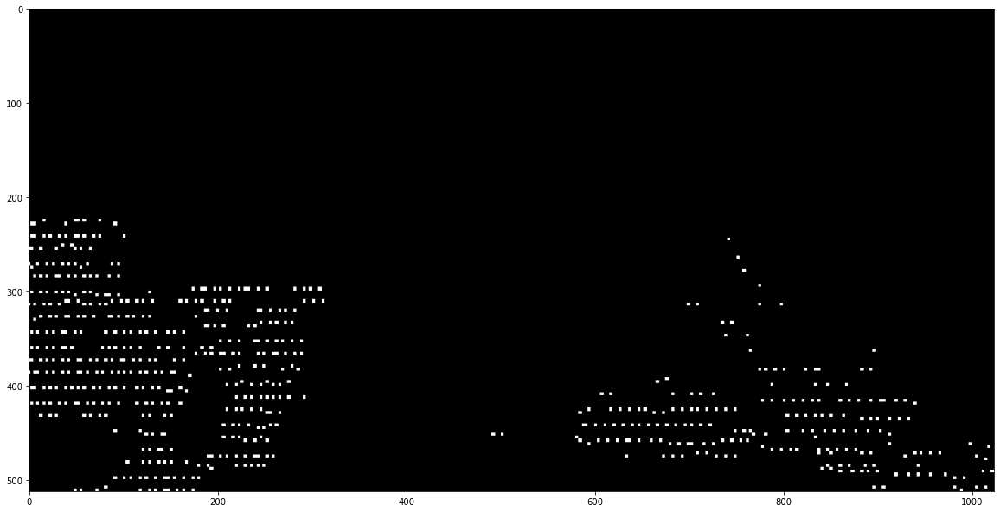

In [34]:
plt.figure(figsize=(20, 20))
plt.imshow((a == 14000), cmap='gray')

In [35]:
d = np.load('data/semkitti_dvps/depth.npy')
print(d.min(), d.max())

0.0 31.6328125


In [41]:
dd = '/home/junwen/Datasets/SemKITTI-DVPS/video_sequence/val/000008_000000_depth_707.0911865234375.png'
ddd = np.array(Image.open(dd))
ddd = ddd / 256.0

In [42]:
ddd.min(), ddd.max()

(0.0, 78.671875)

In [2]:
a = '/home/junwen/Datasets/SemKITTI-DVPS/video_sequence/val/000008_000000_gtFine_class.png'
aa = Image.open(a)
aaa = np.array(aa)
np.unique(aaa)

array([  0,   1,   5,   8,   9,  10,  12,  14,  15,  16,  17,  18, 255],
      dtype=int32)

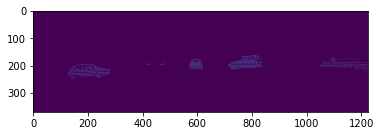

In [3]:
plt.imshow(aaa == 0)

In [4]:
b = a.replace('class', 'instance')
bb = Image.open(b)
bbb = np.array(bb)
np.unique(bbb)

array([  0,   1,   2,   3,  15,  24, 194, 198], dtype=int32)

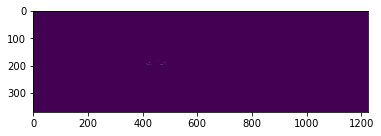

In [5]:
plt.imshow(bbb == 198)

In [6]:
np.sum(bbb == 198)

20

In [7]:
max_ins = 1000
ccc = aaa * max_ins + bbb
np.unique(ccc)

array([     1,      2,      3,    194,    198,   1024,   5000,   5002,
         5015,   8000,   9000,  10000,  12000,  14000,  15000,  16000,
        17000,  18000, 255000], dtype=int32)

In [10]:
np.sum(ccc == 5000)

1

In [9]:
np.sum(aaa == 0)

1227

In [13]:
kernel_size = 5
x_coor = torch.arange(5)
x_grid = x_coor.repeat(kernel_size).view(kernel_size, kernel_size)
y_grid = x_grid.t()
xy_grid = torch.stack([x_grid, y_grid], dim=-1).float()

In [30]:
sigma = 2
mean = (kernel_size - 1)/2.
variance = sigma ** 2.
gaussian_kernel = (1. / (2. * np.pi * variance)) * torch.exp(
    -torch.sum((xy_grid - mean) ** 2., dim=-1) / (2 * variance)
)

In [34]:
torch.pi

3.141592653589793

In [31]:
gaussian_kernel.sum()

tensor(0.6297)

In [33]:
gaussian_kernel / gaussian_kernel.max()

tensor([[0.3679, 0.5353, 0.6065, 0.5353, 0.3679],
        [0.5353, 0.7788, 0.8825, 0.7788, 0.5353],
        [0.6065, 0.8825, 1.0000, 0.8825, 0.6065],
        [0.5353, 0.7788, 0.8825, 0.7788, 0.5353],
        [0.3679, 0.5353, 0.6065, 0.5353, 0.3679]])

In [6]:
feat = torch.randn(1, 3, 5, 5)
unfolded = F.pad(feat, [1,1,1,1]).unfold(2, 3, 1).unfold(3, 3, 1)

In [7]:
feat1 = feat.unsqueeze(-1).unsqueeze(-1)

In [9]:
similarity = (feat1 * unfolded).sum(dim=1, keepdim=True)
similarity.shape

torch.Size([1, 1, 5, 5, 3, 3])

In [3]:
unfolded.shape

torch.Size([1, 3, 5, 5, 3, 3])

In [155]:
ds = np.load('ds.npy')
images = np.load('images.npy')
pix_mean, pix_std = np.array([123.675, 116.280, 103.530]), np.array([58.395, 57.120, 57.375])
images = images * pix_std.reshape(1, 3, 1, 1) + pix_mean.reshape(1, 3, 1, 1)
ds = torch.from_numpy(ds)

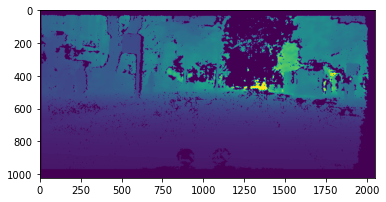

In [156]:
plt.imshow(ds[0])

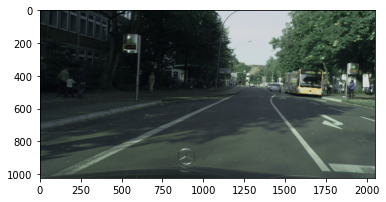

In [157]:
plt.imshow((images[0].transpose(1,2,0)).astype(np.uint8))

In [162]:
d = ds.unsqueeze(1)[0:]
d_pad_x = F.pad(d, (0, 2, 0, 0), mode='replicate')[:, :, :, 2:]
d_avail = (d > 0) & (d_pad_x > 0)
d_unavail = (d == 0) | (d_pad_x == 0)

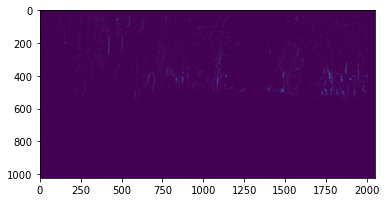

In [163]:
dx = torch.abs(d - d_pad_x)
dx[d_unavail] = 0
plt.imshow(dx[0,0])

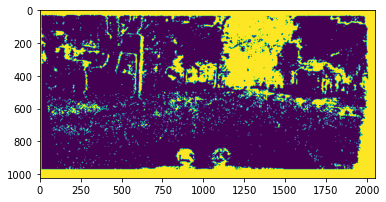

In [165]:
plt.imshow(d_unavail[0,0])

In [160]:
d_pad_y = F.pad(d, (0, 0, 0, 1), mode='replicate')[:, :, 1:, :]
d_avail = (d > 0) & (d_pad_y > 0)
d_unavail = (d == 0) | (d_pad_y == 0)

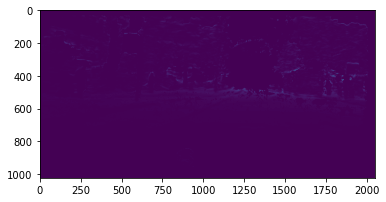

In [161]:
# dy = torch.abs(1/(d+1e-6) - 1/(d_pad_y+1e-6))
dy = torch.abs(d - d_pad_y)
dy[d_unavail] = 0
plt.imshow(dy[0,0])

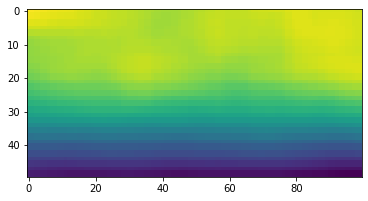

In [114]:
plt.imshow(d[0,0,50:100,:100])

In [119]:
d[0,0,60:70,:10]

tensor([[45.0742, 45.1289, 45.1836, 45.1836, 45.2383, 45.2383, 45.2656, 45.3203,
         45.3203, 45.3203],
        [45.0195, 45.0742, 45.1289, 45.1289, 45.1836, 45.1836, 45.2109, 45.2656,
         45.2656, 45.2930],
        [45.0195, 45.0742, 45.1289, 45.1289, 45.1836, 45.1836, 45.2109, 45.2656,
         45.2656, 45.2930],
        [45.0195, 45.0742, 45.1289, 45.1289, 45.1562, 45.1562, 45.1836, 45.2383,
         45.2383, 45.2656],
        [44.9648, 45.0469, 45.0742, 45.0742, 45.1289, 45.1289, 45.1562, 45.2109,
         45.2109, 45.2383],
        [44.9648, 45.0469, 45.0742, 45.0742, 45.1289, 45.1289, 45.1562, 45.2109,
         45.2109, 45.2383],
        [44.8828, 44.9375, 44.9922, 44.9922, 45.0742, 45.0742, 45.1289, 45.1836,
         45.1836, 45.2383],
        [44.8828, 44.9375, 44.9922, 44.9922, 45.0742, 45.0742, 45.1289, 45.1836,
         45.1836, 45.2383],
        [44.7461, 44.8008, 44.8828, 44.8828, 44.9648, 44.9648, 45.0469, 45.1562,
         45.1562, 45.2109],
        [44.5547, 4

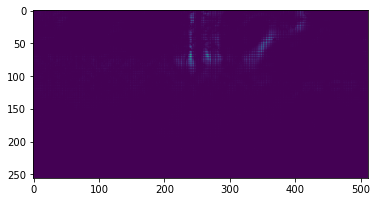

In [105]:
plt.imshow((dx * dy)[0,0])

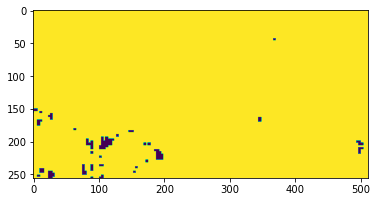

In [88]:
plt.imshow(d_avail[0,0])

In [71]:
d = ds[1]
# d_avail, d_unavail = d > 0, d == 0
d_pad_x = np.pad(d, ((0, 0), (1, 0)), mode='edge')
d_unavail = d > 0 & d_pad_x > 0
# d_x = d - np.pad(d, ((0, 0), (1, 0)), 'edge')[:, :-1]
# d_avail, d_unavail = np.pad(d, ((0, 0), (1, 0)), 'edge')[:, :-1] > 0, np.pad(d, ((0, 0), (1, 0)), 'edge')[:, :-1] == 0
# d_y = d[:-1, :] - d[1:, :]

TypeError: ufunc 'bitwise_and' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [70]:
d_pad_x.shape

(256, 513)

In [56]:
np.pad(d, ((0, 0), (0, 1)), 'edge').shape

(256, 513)

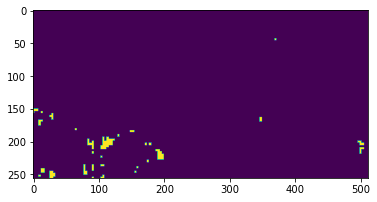

In [63]:
plt.imshow(d_unavail)

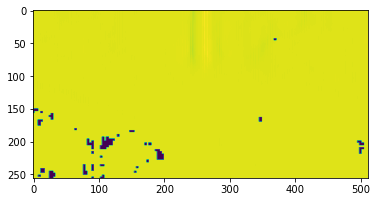

In [64]:
d_x[d_unavail] = d_x.min()
plt.imshow(d_x)

In [3]:
f = "/home/junwen/Desktop/testvideo/"
folders = ["0072", "4548", "4585", "4586", "4590"]
p = os.path.join(f, folders[3], 'seg', str(12)+'_panoptic.png')
p = Image.open(p)
pp = np.array(p)

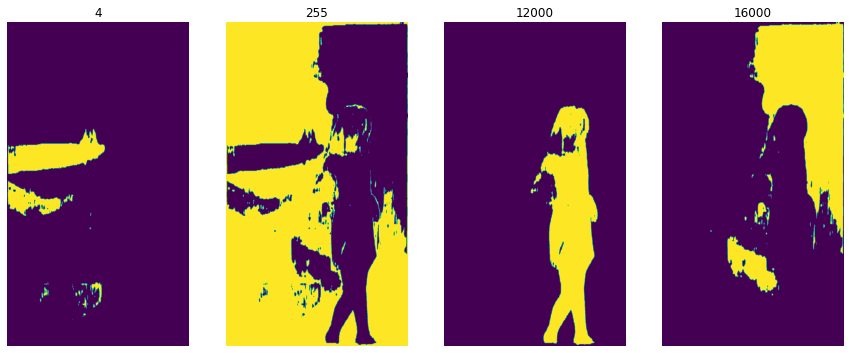

In [4]:
plt.figure(figsize=(15, 15))
for i in range(len(np.unique(pp))):
    plt.subplot(1, len(np.unique(pp)), i+1)
    plt.axis('off')
    plt.title(str(np.unique(pp)[i]))
    plt.imshow(pp == np.unique(pp)[i])

In [5]:
f = "/home/junwen/Desktop/testvideo/"
folders = ["0072", "4548", "4585", "4586", "4590"]
d = os.path.join(f, folders[3], 'seg_', str(12)+'_depth_argmax.png')
d = Image.open(d)
dd = np.array(d)

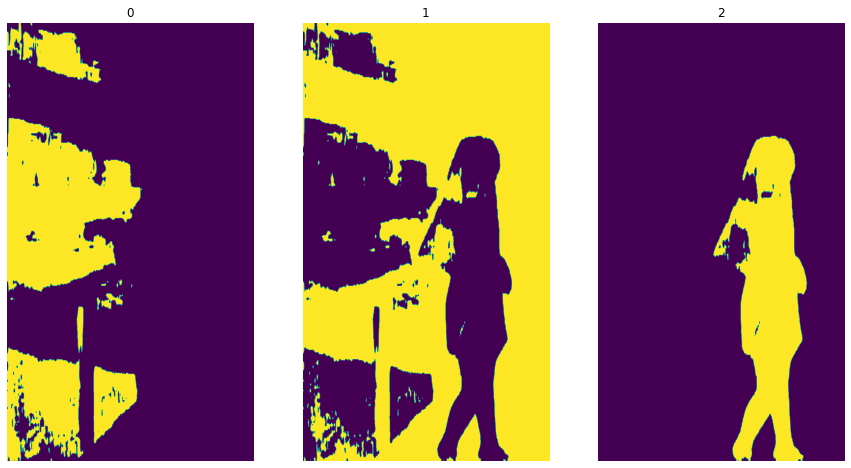

In [6]:
plt.figure(figsize=(15, 15))
for i in range(len(np.unique(dd))):
    plt.subplot(1, len(np.unique(dd)), i+1)
    plt.axis('off')
    plt.title(str(np.unique(dd)[i]))
    plt.imshow(dd == np.unique(dd)[i])

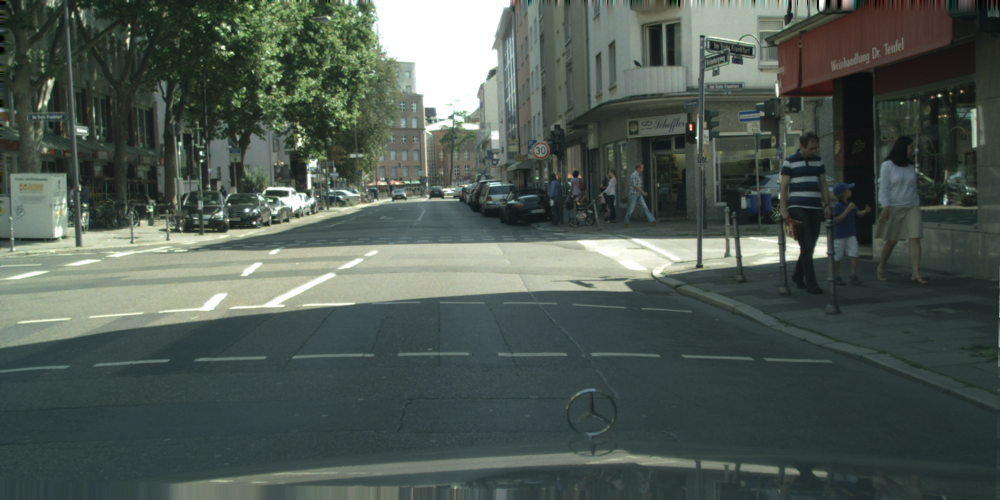

In [3]:
img = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/000049_000005_frankfurt_000000_020331_leftImg8bit.png'
img = Image.open(img)
img

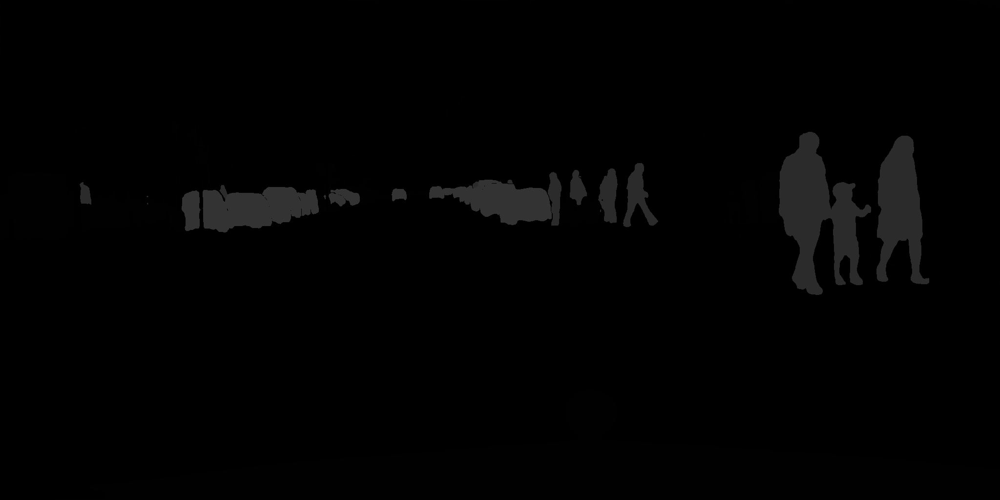

In [14]:
pred_p = 'output/city-dvps/58/panoptic/000049_000005_frankfurt_000000_020331_panoptic.png'
pred_p = Image.open(pred_p)
pred_p

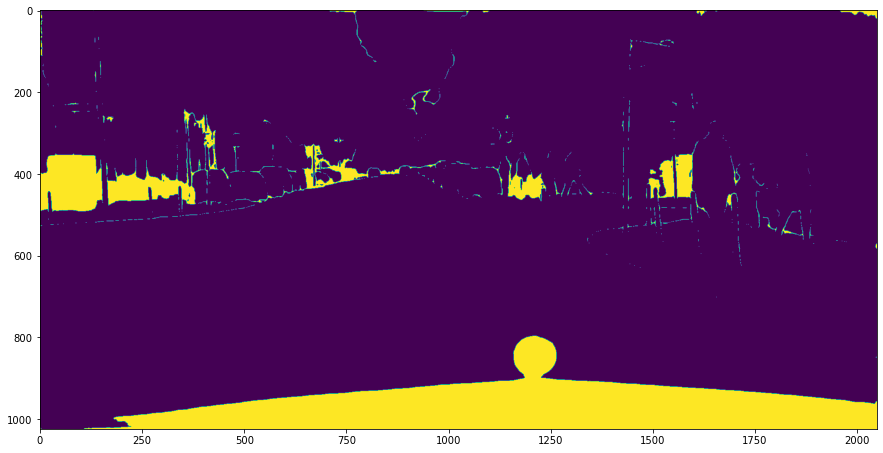

In [17]:
pred_p = np.array(pred_p)
plt.figure(figsize=(15, 15))
plt.imshow(pred_p == 255)

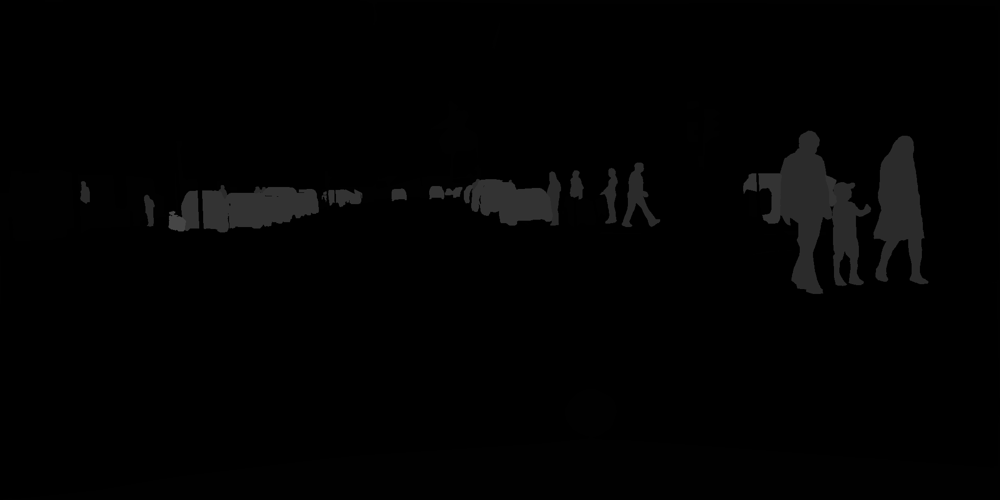

In [15]:
gt_p = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/000049_000005_frankfurt_000000_020331_gtFine_instanceTrainIds.png'
gt_p = Image.open(gt_p)
gt_p

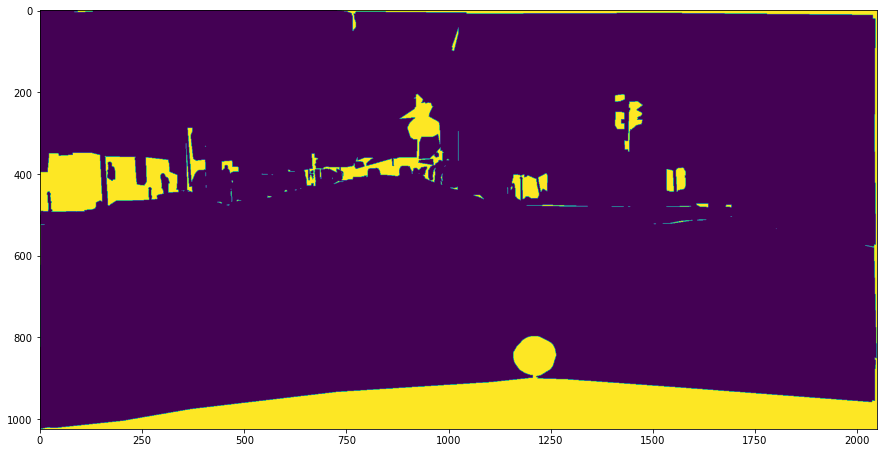

In [18]:
gt_p = np.array(gt_p)
plt.figure(figsize=(15, 15))
plt.imshow(gt_p == 255)

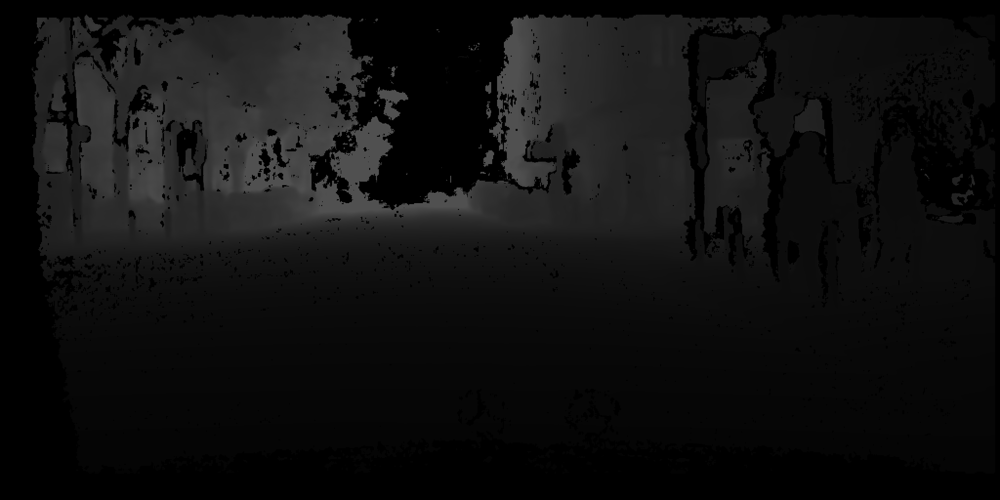

In [4]:
gt_depth = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/000049_000005_frankfurt_000000_020331_depth.png'
gt_depth = Image.open(gt_depth)
gt_depth

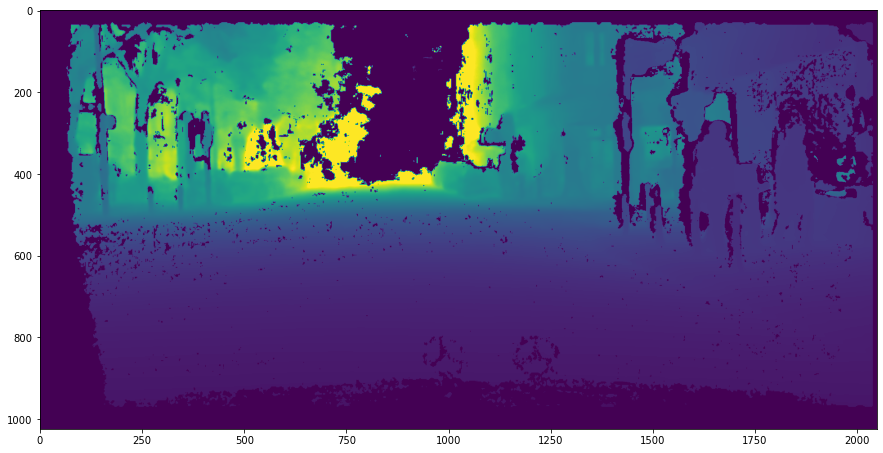

In [12]:
d = np.array(gt_depth) / 256
plt.figure(figsize=(15, 15))
plt.imshow(d)

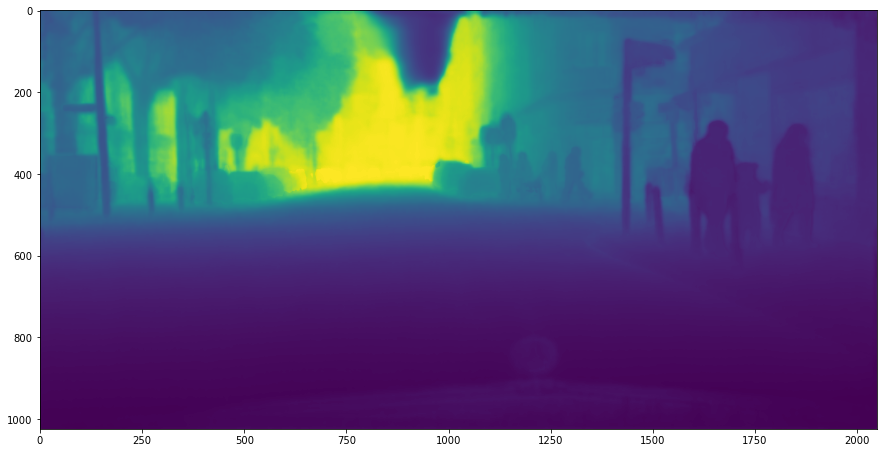

In [23]:
pred_d = 'output/city-dvps/58/depth/000049_000005_frankfurt_000000_020331_depth.png'
pred_d = Image.open(pred_d)
pred_d = np.array(pred_d)
plt.figure(figsize=(15, 15))
plt.imshow(pred_d)

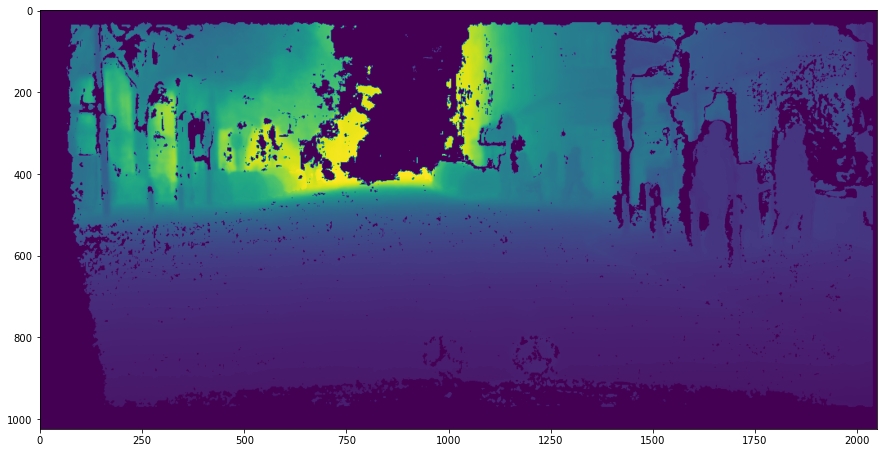

In [28]:
pred_dd = pred_d * (d > 0)
plt.figure(figsize=(15, 15))
plt.imshow(pred_dd)

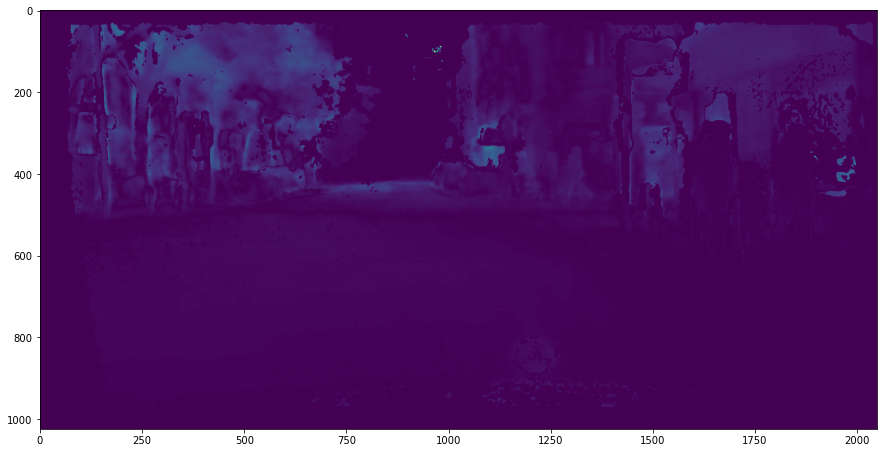

In [35]:
plt.figure(figsize=(15, 15))
diff = np.abs(pred_dd - gt_depth)
plt.imshow(diff)

In [4]:
from detectron2.data import build_detection_train_loader
from detectron2.config import get_cfg

from detectron2.data import DatasetCatalog
from detectron2.utils.visualizer import ColorMode, Visualizer
from data.cityscapes_dvps.cityscapes_dvps import register_all_cityscapes_dvps
from data.cityscapes_dvps.dataset_mapper import CityscapesDVPSDatasetMapper
from maskformer_config import add_maskformer2_config

cfg = get_cfg()
add_maskformer2_config(cfg)
cfg.merge_from_file("/home/junwen/Depth/shit-d/configs/maskformer/test.yaml")
cfg.freeze()

register_all_cityscapes_dvps(root="/home/junwen/Datasets/")
mapper = CityscapesDVPSDatasetMapper(cfg, is_train=True)
d = build_detection_train_loader(cfg, mapper=mapper)
for batched_inputs in d:
    print(batched_inputs[0].keys())
    break

dict_keys(['image_id', 'height', 'width', 'file_name', 'depth', 'image', 'instances'])


In [5]:
depth = batched_inputs[0]['depth']
img = batched_inputs[0]['image'].permute(1, 2, 0)
instances = batched_inputs[0]['instances']

In [20]:
instances.gt_masks[4].sum()

tensor(90)

In [21]:
90/512/1024

0.000171661376953125

In [7]:
plt.imshow(instances.gt_masks[0])

IndexError: index 1 is out of bounds for dimension 0 with size 1

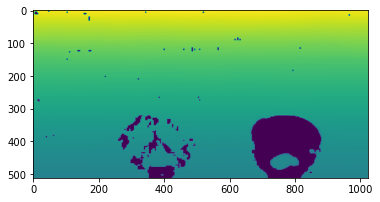

In [8]:
plt.imshow(depth)

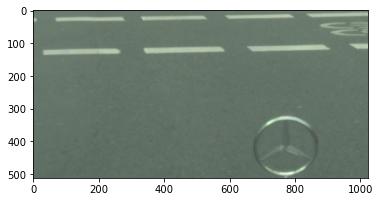

In [9]:
plt.imshow(img)

In [5]:
d = os.path.join(root, 'Cityscapes-DVPS/video_sequence/train', file_dicts[0]['depth'])
depth_gt = np.array(Image.open(d))

In [10]:
np.unique(depth_gt / 256)

array([ 0.       ,  4.421875 ,  4.4296875, ..., 79.8671875, 79.953125 ,
       80.       ])

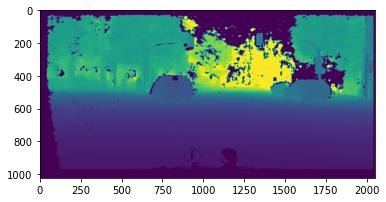

In [6]:
plt.imshow(depth_gt)

In [29]:
im = os.path.join(root, 'Cityscapes-DVPS/video_sequence/train', file_dicts[0]['seg'])
seg = np.asarray(Image.open(im), order='F')

In [33]:
seg.max()

18026

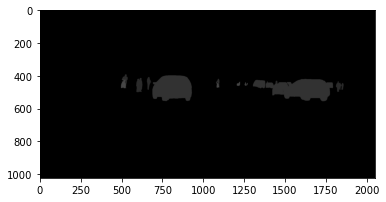

In [26]:
plt.imshow(im)

In [68]:
c = torch.randn(10, 6).abs()
m = torch.randn(10, 4, 8).abs().sigmoid()
c = F.softmax(c, dim=-1)[..., :-1]

In [69]:
s = torch.einsum("qc,qhw->chw", c, m)
s.shape

torch.Size([5, 4, 8])

In [71]:
a = torch.arange(5).unsqueeze(0).repeat(10, 1).flatten(0, 1)
a

tensor([0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3,
        4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2, 3, 4, 0, 1, 2,
        3, 4])

In [66]:
scores, labels = F.softmax(c, dim=-1).max(-1)
keep = labels.ne(6) & (scores > 0.25)
cur_scores = scores[keep]

In [42]:
print(b.shape)
print(b[-1].shape)

torch.Size([2, 5])
torch.Size([5])


In [34]:
indices = [(torch.as_tensor([2, 1], dtype=torch.int64), torch.as_tensor([0, 1], dtype=torch.int64))]
print(indices)
batch_idx = torch.cat([torch.full_like(src, i) for i, (src, _) in enumerate(indices)])
print(batch_idx)
src_idx = torch.cat([src for (src, _) in indices])
src_idx

[(tensor([2, 1]), tensor([0, 1]))]
tensor([0, 0])


tensor([2, 1])

In [35]:
[j for (_, j) in indices]

[tensor([0, 1])]

In [72]:
from detectron2.config import get_cfg
from maskformer_config import add_maskformer2_config

cfg = get_cfg()
add_maskformer2_config(cfg)
cfg.merge_from_file('configs/maskformer/r50.yaml')
cfg.freeze()
cfg

CfgNode({'VERSION': 2, 'MODEL': CfgNode({'LOAD_PROPOSALS': False, 'MASK_ON': False, 'KEYPOINT_ON': False, 'DEVICE': 'cuda', 'META_ARCHITECTURE': 'MaskFormer', 'WEIGHTS': 'detectron2://ImageNetPretrained/torchvision/R-50.pkl', 'PIXEL_MEAN': [123.675, 116.28, 103.53], 'PIXEL_STD': [58.395, 57.12, 57.375], 'BACKBONE': CfgNode({'NAME': 'build_resnet_backbone', 'FREEZE_AT': 0}), 'FPN': CfgNode({'IN_FEATURES': [], 'OUT_CHANNELS': 256, 'NORM': '', 'FUSE_TYPE': 'sum'}), 'PROPOSAL_GENERATOR': CfgNode({'NAME': 'RPN', 'MIN_SIZE': 0}), 'ANCHOR_GENERATOR': CfgNode({'NAME': 'DefaultAnchorGenerator', 'SIZES': [[32, 64, 128, 256, 512]], 'ASPECT_RATIOS': [[0.5, 1.0, 2.0]], 'ANGLES': [[-90, 0, 90]], 'OFFSET': 0.0}), 'RPN': CfgNode({'HEAD_NAME': 'StandardRPNHead', 'IN_FEATURES': ['res4'], 'BOUNDARY_THRESH': -1, 'IOU_THRESHOLDS': [0.3, 0.7], 'IOU_LABELS': [0, -1, 1], 'BATCH_SIZE_PER_IMAGE': 256, 'POSITIVE_FRACTION': 0.5, 'BBOX_REG_LOSS_TYPE': 'smooth_l1', 'BBOX_REG_LOSS_WEIGHT': 1.0, 'BBOX_REG_WEIGHTS': (

In [2]:
from detectron2.data import build_detection_train_loader
from detectron2.config import get_cfg
from data.cityscapes.cityscapes_panoptic import register_all_cityscapes_panoptic
from data.cityscapes.dataset_mapper import CityscapesPanopticDatasetMapper
import sys

sys.path.append("/home/junwen/Depth/shit-d/")
from config import add_config

cfg = get_cfg()
add_config(cfg)
cfg.merge_from_file("configs/cityscapes.yaml")
cfg.freeze()
register_all_cityscapes_panoptic(root="/home/junwen/Datasets/")
mapper = CityscapesPanopticDatasetMapper(cfg, is_train=True)
d = build_detection_train_loader(cfg, mapper=mapper)
for batched_inputs in d:
    print(batched_inputs[0].keys())
    break

/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/site-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


dict_keys(['file_name', 'image_id', 'segments_info', 'width', 'height', 'image', 'sem_seg'])


In [3]:
from model.panoptic_seg import PanopticFCN
p = PanopticFCN(cfg)

In [4]:
p.training = False
gt_dict, pred_centers, pred_regions, pred_weights = p(batched_inputs)

/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272168290/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/junwen/Depth/shit-d/model/utils.py:18: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  topk_ys = (topk_inds // width).float()
/home/junwen/Depth/shit-d/model/utils.py:24: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It

torch.Size([391, 256])
torch.Size([391, 391])
torch.Size([391, 391])
torch.Size([391, 391])
torch.Size([391, 391])


AssertionError: 

In [31]:
for batched_inputs in d:
    break

In [5]:
pred_centers, pred_regions, pred_weights, encode_feat, gt_dict = p(batched_inputs)

/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272168290/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [8]:
for k, v in gt_dict.items():
    print(k, v[0].shape)

center torch.Size([2, 8, 64, 128])
inst torch.Size([2, 150, 128, 256])
index torch.Size([2, 150])
index_mask torch.Size([2, 150])
class torch.Size([2, 150])
sem_scores torch.Size([2, 19, 64, 128])
sem_labels torch.Size([2, 19, 128, 256])
sem_masks torch.Size([2, 19, 64, 128])
sem_index torch.Size([2, 19])


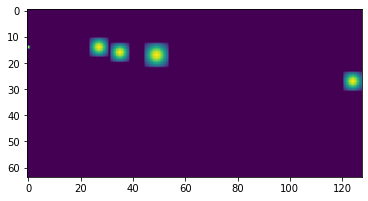

In [27]:
plt.imshow(gt_dict['center'][0][1, 2].cpu())

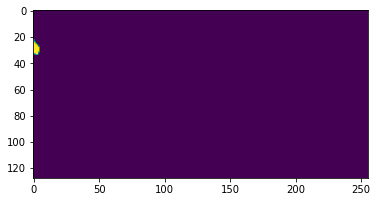

In [38]:
plt.imshow(gt_dict['inst'][0][1, 0].cpu())

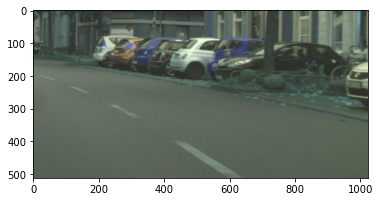

In [9]:
plt.imshow(batched_inputs[1]['image'].permute(1, 2, 0))

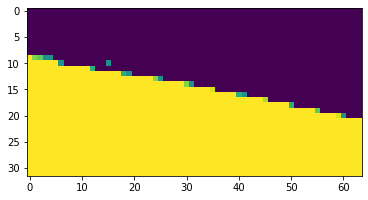

In [96]:
plt.imshow(gt_dict['sem_scores'][1][1, 0].cpu())

In [148]:
gt_dict['sem_index'][0][0].cpu()

tensor([1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.])

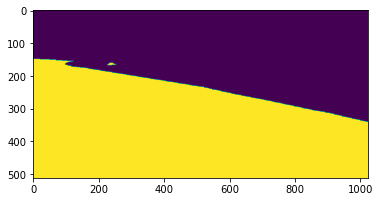

In [132]:
plt.imshow(batched_inputs[1]['sem_seg'] == 0)

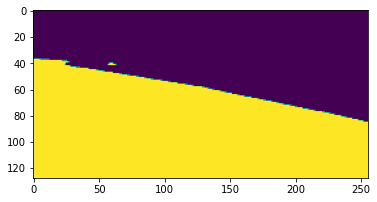

In [118]:
plt.imshow(gt_dict['sem_labels'][0][1, 0].cpu())

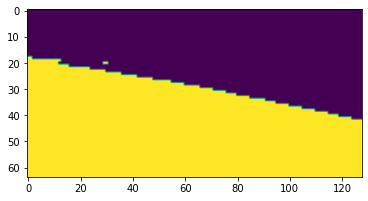

In [117]:
plt.imshow(gt_dict['sem_masks'][0][1, 0].cpu())

In [2]:
a = {}
a['disps'] = torch.randn(1, 1, 1, 1)

In [5]:
for aa in a:
    print(type(aa))

<class 'str'>


In [9]:
from detectron2.config import get_cfg
from model.monodepth import *
from config import add_monodepth_config
cfg = get_cfg()
add_monodepth_config(cfg)
cfg.merge_from_file('config.yaml')
cfg.freeze()

# encoder = build_resnet_backbone_anydepth(cfg, ShapeSpec(3), cfg.MODEL.DEPTH.DEPTH_NUM_LAYERS)
# decoder = DepthDecoder(np.array([64, 64, 128, 256, 512]))

In [4]:
i = torch.randn(1, 3, 192, 640)
o = encoder(i)
for k, v in o.items():
    print(k, v.shape)

res2 torch.Size([1, 64, 48, 160])
res3 torch.Size([1, 128, 24, 80])
res4 torch.Size([1, 256, 12, 40])
res5 torch.Size([1, 512, 6, 20])


In [3]:
decoder

DepthDecoder(
  (decoder): ModuleList(
    (0): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (1): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (2): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (3): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1))
      )
      (nonlin): ELU(alpha=1.0, inplace=True)
    )
    (4): ConvBlock(
      (conv): Conv3x3(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv

In [4]:
i = torch.randn(1, 3, 192, 640)
o = encoder(i)
o = decoder(o)

In [8]:
for i in o.values():
    print(i.shape)

torch.Size([1, 64, 48, 160])
torch.Size([1, 64, 48, 160])
torch.Size([1, 128, 24, 80])
torch.Size([1, 256, 12, 40])
torch.Size([1, 512, 6, 20])


In [5]:
for k, v in o.items():
    print(k, v.shape)

('disp', 2) torch.Size([1, 1, 24, 80])
('disp', 1) torch.Size([1, 1, 48, 160])
('disp', 0) torch.Size([1, 1, 96, 320])


In [10]:
for res in o:
    print(res)

res2
res3
res4
res5


In [15]:
from detectron2.config import get_cfg
cfg = get_cfg()
cfg.INPUT.HEIGHT = 5

In [2]:
_RAW_KITTI_EIGEN_SPLITS = {
    "kitti_zhou_train": ("data_splits/eigen_zhou_files.txt", ""),
    "kitti_eigen_test_original": ("data_splits/eigen_test_files.txt", "original"),
    "kitti_eigen_test_improved": ("data_splits/eigen_test_files.txt", "improved"),
}

In [5]:
from data.kitti import load_kitti_eigen
root = "/home/junwen/Datasets/KITTI/packnet/KITTI_raw/"
s = _RAW_KITTI_EIGEN_SPLITS["kitti_eigen_test_improved"]
ret = load_kitti_eigen(root, s[0], s[1])

In [24]:
from data.dataset_mapper import *
from data.kitti import register_kitti_eigen
from detectron2.data import build_detection_train_loader, build_detection_test_loader
# register_kitti_eigen(root)
# mapper = TrainDatasetMapper(cfg, is_train=True)
# t = build_detection_train_loader(cfg, mapper=mapper)
mapper = TestDatasetMapper(cfg, is_train=False)
t = build_detection_test_loader(cfg, dataset_name="kitti_eigen_test_improved", mapper=mapper)

In [25]:
for tt in t:
    print(tt)
    break

[{'file_name': '/home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000069.png', 'image_id': '2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000069', 'depth_file_name': '/home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/proj_depth/groundtruth/image_02/0000000069.png', 'prev_img_file_name': '/home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000068.png', 'next_img_file_name': '/home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000070.png', 'calibration_info': {'intrinsic': {'fx': 721.5377, 'fy': 721.5377, 'u0': 609.5593, 'v0': 172.854}}, 'width': 1242, 'height': 375, 'image_orig': tensor([[[ 13,   5,   5,  ...,  11,  10,  11],
         [ 22,   4,   5,  ...,  11,  10,  10],
         [ 21,   7,   7,  ...,  12,  11,  10],
         ...,
         [ 70,  95, 118,  ...,  56,  55,  52],
         [125, 1

In [28]:
for k, v in tt[0].items():
    if isinstance(v, torch.Tensor):
        print(k, v.shape)
    else:
        print(k, v)

file_name /home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000069.png
image_id 2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000069
depth_file_name /home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/proj_depth/groundtruth/image_02/0000000069.png
prev_img_file_name /home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000068.png
next_img_file_name /home/junwen/Datasets/KITTI/packnet/KITTI_raw/2011_09_26/2011_09_26_drive_0002_sync/image_02/data/0000000070.png
calibration_info {'intrinsic': {'fx': 721.5377, 'fy': 721.5377, 'u0': 609.5593, 'v0': 172.854}}
width 1242
height 375
image_orig torch.Size([3, 192, 640])


In [9]:
with open(os.path.join(root, _RAW_KITTI_EIGEN_SPLITS["kitti_eigen_test"][0])) as f:
    files = f.read().splitlines()

In [10]:
files

['2011_09_26/2011_09_26_drive_0002_sync 0000000069 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000054 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000042 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000057 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000030 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000027 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000012 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000075 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000036 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000033 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000015 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000072 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000003 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000039 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000009 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000051 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000060 l',
 '2011_09_26/2011_09_26_drive_0002_sync 0000000021 l',
 '2011_09_

In [19]:
scores = torch.randn(2, 4, 1, 6)
topk_scores, topk_inds = torch.topk(scores.reshape(2, 4, -1), 5)
topk_score, index = torch.topk(topk_scores.reshape(2, -1), 5)

In [20]:
topk_inds.shape

torch.Size([2, 4, 5])

In [13]:
topk_score

tensor([[2.1107, 1.3072, 1.2443, 1.2042, 0.9718],
        [1.7652, 1.3009, 1.2399, 0.9709, 0.8928]])

In [24]:
topk_inds1 = topk_inds.view(2, -1, 1)
dim = topk_inds1.size(-1)
index1 = index.unsqueeze(len(index.shape)).expand(*index.shape, dim)
f = topk_inds1.gather(dim=1, index=index1)
f

tensor([[[5],
         [3],
         [5],
         [3],
         [1]],

        [[1],
         [0],
         [0],
         [4],
         [2]]])

In [16]:
index.shape

torch.Size([2, 5])

In [6]:
a = torch.arange(24).reshape(1, 1, 4, 6).clamp(5, 20)
class_st, num_class_st = torch.unique(a, return_counts=True)
print(class_st, num_class_st)

tensor([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]) tensor([6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4])


[autoreload of model.panoptic_seg failed: Traceback (most recent call last):
  File "/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/home/junwen/anaconda3/envs/py37_torch1100/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 728, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/home/junwen/Depth/shit-d/model/panoptic_seg.py", line 24, in <module>
    class Pan

In [7]:
class_st.shape

torch.Size([16])

In [10]:
F.one_hot(a, num_classes=24).shape

torch.Size([1, 1, 4, 6, 24])

In [13]:
a.shape

torch.Size([1, 1, 4, 6])

In [5]:
a = torch.randn([5])
a.unsqueeze(-1) == a.unsqueeze(0)

tensor([[ True, False, False, False, False],
        [False,  True, False, False, False],
        [False, False,  True, False, False],
        [False, False, False,  True, False],
        [False, False, False, False,  True]])

In [118]:
import os
gt_dir = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/'
gt_names = os.scandir(gt_dir)
gt_names = [name.name for name in gt_names if 'gtFine' in name.name]

In [119]:
def load_sequence(inp_lst):
    out_dict = dict()
    for inp in inp_lst:
        seq_id = inp.split('_')[0]
        if seq_id not in out_dict:
            out_dict[seq_id] = []
        out_dict[seq_id].append(inp)
    for seq_id in out_dict:
        out_dict[seq_id] = sorted(out_dict[seq_id])
    return out_dict

In [120]:
gts = load_sequence(gt_names)
gts

{'000030': ['000030_000000_frankfurt_000001_029221_gtFine_instanceTrainIds.png',
  '000030_000001_frankfurt_000001_029226_gtFine_instanceTrainIds.png',
  '000030_000002_frankfurt_000001_029231_gtFine_instanceTrainIds.png',
  '000030_000003_frankfurt_000001_029236_gtFine_instanceTrainIds.png',
  '000030_000004_frankfurt_000001_029241_gtFine_instanceTrainIds.png',
  '000030_000005_frankfurt_000001_029246_gtFine_instanceTrainIds.png'],
 '000046': ['000046_000000_frankfurt_000000_007350_gtFine_instanceTrainIds.png',
  '000046_000001_frankfurt_000000_007355_gtFine_instanceTrainIds.png',
  '000046_000002_frankfurt_000000_007360_gtFine_instanceTrainIds.png',
  '000046_000003_frankfurt_000000_007365_gtFine_instanceTrainIds.png',
  '000046_000004_frankfurt_000000_007370_gtFine_instanceTrainIds.png',
  '000046_000005_frankfurt_000000_007375_gtFine_instanceTrainIds.png'],
 '000047': ['000047_000000_frankfurt_000000_011059_gtFine_instanceTrainIds.png',
  '000047_000001_frankfurt_000000_011064_gtFi

In [121]:
gts = [np.array(Image.open(os.path.join(gt_dir, name))) for name in gts['000030']]

In [122]:
g = gts[0]
g

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=int32)

In [123]:
np.unique(g)

array([    0,     2,     4,     5,     6,     7,     8,    10,   255,
       11001, 11032, 13000, 13001, 13004, 13008, 13010, 13012, 13013,
       13014, 13030, 13031], dtype=int32)

In [125]:
import six
def _ids_to_counts(id_array):
    ids, counts = np.unique(id_array, return_counts=True)
    return dict(six.moves.zip(ids, counts))

In [126]:
gt_areas = _ids_to_counts(g)
gt_areas

{0: 626247,
 2: 612559,
 4: 99118,
 5: 15628,
 6: 1351,
 7: 15426,
 8: 7806,
 10: 36185,
 255: 306684,
 11001: 7379,
 11032: 216,
 13000: 2150,
 13001: 914,
 13004: 1607,
 13008: 6145,
 13010: 5451,
 13012: 39959,
 13013: 690,
 13014: 64714,
 13030: 156455,
 13031: 90468}

In [128]:
max_ins, ign_id = 1000, 32
void_id = ign_id * max_ins
# ign_ids = {gt_id for gt_id in six.iterkeys(gt_areas) if (gt_id // max_ins) == ign_id}
ign_ids = {gt_id for gt_id in six.iterkeys(gt_areas) if gt_id == ign_id}
ign_ids

set()

In [23]:
ign_id, max_ins = 32, 1000
void_id = ign_id * max_ins
ign_ids = {
    gt_id for gt_id in six.iterkeys(gt_areas) if (gt_id // max_ins) == ign_id
}
ign_ids

{32000}

In [117]:
from evaluation.eval_dvps import *
d = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/'
name = '000030_000000_frankfurt_000001_029221_gtFine_instanceTrainIds.png'
pan_gt = np.array(Image.open(os.path.join(d, name)))
# pan_gt[pan_gt == 255] = 32

In [73]:
vpq_eval([[pan_gt], [pan_gt]])

gt_areas {0: 626247, 2: 612559, 4: 99118, 5: 15628, 6: 1351, 7: 15426, 8: 7806, 10: 36185, 255: 306684, 11001: 7379, 11032: 216, 13000: 2150, 13001: 914, 13004: 1607, 13008: 6145, 13010: 5451, 13012: 39959, 13013: 690, 13014: 64714, 13030: 156455, 13031: 90468}
ign_ids {255}


(array([ 9.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,
        10.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([ 9.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,
        10.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.]),
 array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.]))

In [72]:
gt_areas = {0: 626247, 2: 612559, 4: 99118, 5: 15628, 6: 1351, 7: 15426, 8: 7806, 10: 36185, 255: 306684, 11001: 7379, 11032: 216, 13000: 2150, 13001: 914, 13004: 1607, 13008: 6145, 13010: 5451, 13012: 39959, 13013: 690, 13014: 64714, 13030: 156455, 13031: 90468}
[gt_id for gt_id in six.iterkeys(gt_areas)]

[0,
 2,
 4,
 5,
 6,
 7,
 8,
 10,
 255,
 11001,
 11032,
 13000,
 13001,
 13004,
 13008,
 13010,
 13012,
 13013,
 13014,
 13030,
 13031]

In [63]:
from detectron2.data.datasets.builtin_meta import CITYSCAPES_CATEGORIES
thing_dataset_id_to_contiguous_id = {}
for k in CITYSCAPES_CATEGORIES:
    if k["isthing"] == 1:
        thing_dataset_id_to_contiguous_id[k["id"]] = k["trainId"]
label_divisor = 1000
panoptic_img = pan_gt.copy()

segments_info = []
for panoptic_label in np.unique(panoptic_img):
    if panoptic_label == -1:
        # VOID region.
        continue
    pred_class = panoptic_label // label_divisor
    isthing = (
        pred_class in thing_dataset_id_to_contiguous_id.values()
    )
    segments_info.append(
        {
            "id": int(panoptic_label) + 1,
            "category_id": int(pred_class),
            "isthing": bool(isthing),
        }
    )

In [64]:
segments_info

[{'id': 1, 'category_id': 0, 'isthing': False},
 {'id': 3, 'category_id': 0, 'isthing': False},
 {'id': 5, 'category_id': 0, 'isthing': False},
 {'id': 6, 'category_id': 0, 'isthing': False},
 {'id': 7, 'category_id': 0, 'isthing': False},
 {'id': 8, 'category_id': 0, 'isthing': False},
 {'id': 9, 'category_id': 0, 'isthing': False},
 {'id': 11, 'category_id': 0, 'isthing': False},
 {'id': 33, 'category_id': 0, 'isthing': False},
 {'id': 11002, 'category_id': 11, 'isthing': True},
 {'id': 11033, 'category_id': 11, 'isthing': True},
 {'id': 13001, 'category_id': 13, 'isthing': True},
 {'id': 13002, 'category_id': 13, 'isthing': True},
 {'id': 13005, 'category_id': 13, 'isthing': True},
 {'id': 13009, 'category_id': 13, 'isthing': True},
 {'id': 13011, 'category_id': 13, 'isthing': True},
 {'id': 13013, 'category_id': 13, 'isthing': True},
 {'id': 13014, 'category_id': 13, 'isthing': True},
 {'id': 13015, 'category_id': 13, 'isthing': True},
 {'id': 13031, 'category_id': 13, 'isthing': T

In [97]:
fname = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/000000_000000_munster_000168_000004_leftImg8bit.png'
f = np.array(Image.open(fname))

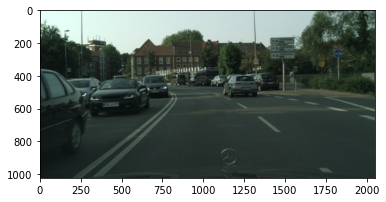

In [77]:
plt.imshow(f)

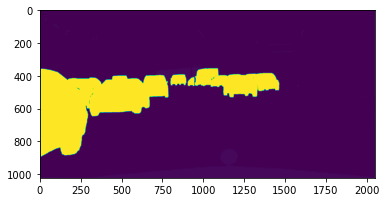

In [95]:
p = np.array(Image.open(fname.replace("leftImg8bit", "gtFine_instanceTrainIds")))
plt.imshow(p)

In [98]:
f.shape

(1024, 2048, 3)

In [ ]:
24.9629,50.6876,6.2540

In [101]:
f = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/tmp/000000_000000_munster_000168_000004_gtFine_instanceTrainIds.png'
n = np.array(Image.open(f))
n

array([[ 10,  10,  10, ...,   8,   8,   8],
       [ 10,  10,  10, ...,   8,   8,   8],
       [ 10,  10,  10, ...,   8,   8,   8],
       ...,
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255]], dtype=int32)

In [102]:
np.unique(n)

array([    0,     1,     2,     3,     4,     5,     6,     7,     8,
          10,   255, 13000, 13001, 13002, 13003, 13004, 13005, 13006,
       13007, 13008, 13009, 13010, 13011, 13012, 13013], dtype=int32)

In [104]:
with open('/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/dvps_cityscapes_val.json') as f:
    j = json.load(f)
j

[{'height': 1024,
  'width': 2048,
  'image': '000000_000000_munster_000168_000004_leftImg8bit.png',
  'depth': '000000_000000_munster_000168_000004_depth.png',
  'seg': '000000_000000_munster_000168_000004_gtFine_instanceTrainIds.png'},
 {'height': 1024,
  'width': 2048,
  'image': '000000_000001_munster_000168_000009_leftImg8bit.png',
  'depth': '000000_000001_munster_000168_000009_depth.png',
  'seg': '000000_000001_munster_000168_000009_gtFine_instanceTrainIds.png'},
 {'height': 1024,
  'width': 2048,
  'image': '000000_000002_munster_000168_000014_leftImg8bit.png',
  'depth': '000000_000002_munster_000168_000014_depth.png',
  'seg': '000000_000002_munster_000168_000014_gtFine_instanceTrainIds.png'},
 {'height': 1024,
  'width': 2048,
  'image': '000000_000003_munster_000168_000019_leftImg8bit.png',
  'depth': '000000_000003_munster_000168_000019_depth.png',
  'seg': '000000_000003_munster_000168_000019_gtFine_instanceTrainIds.png'},
 {'height': 1024,
  'width': 2048,
  'image': '0

In [109]:
with open('/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val.json') as f:
    jj = json.load(f)
jj['annotations']

[{'file_name': 'frankfurt_000000_000294_gtFine_panoptic.png',
  'image_id': 'frankfurt_000000_000294',
  'segments_info': [{'area': 624611,
    'bbox': [6, 432, 1909, 547],
    'category_id': 7,
    'id': 7,
    'iscrowd': 0},
   {'area': 168735,
    'bbox': [6, 429, 2037, 528],
    'category_id': 8,
    'id': 8,
    'iscrowd': 0},
   {'area': 820275,
    'bbox': [6, 5, 2037, 702],
    'category_id': 11,
    'id': 11,
    'iscrowd': 0},
   {'area': 2795,
    'bbox': [928, 392, 85, 55],
    'category_id': 13,
    'id': 13,
    'iscrowd': 0},
   {'area': 24870,
    'bbox': [25, 16, 1680, 766],
    'category_id': 17,
    'id': 17,
    'iscrowd': 0},
   {'area': 12149,
    'bbox': [275, 82, 1375, 409],
    'category_id': 20,
    'id': 20,
    'iscrowd': 0},
   {'area': 42120,
    'bbox': [887, 87, 199, 315],
    'category_id': 21,
    'id': 21,
    'iscrowd': 0},
   {'area': 37067,
    'bbox': [801, 7, 384, 265],
    'category_id': 23,
    'id': 23,
    'iscrowd': 0},
   {'area': 413,
    

In [108]:
{el['id']: el for el in jj['categories']}

{7: {'color': [128, 64, 128],
  'id': 7,
  'isthing': 0,
  'name': 'road',
  'supercategory': 'flat'},
 8: {'color': [244, 35, 232],
  'id': 8,
  'isthing': 0,
  'name': 'sidewalk',
  'supercategory': 'flat'},
 11: {'color': [70, 70, 70],
  'id': 11,
  'isthing': 0,
  'name': 'building',
  'supercategory': 'construction'},
 12: {'color': [102, 102, 156],
  'id': 12,
  'isthing': 0,
  'name': 'wall',
  'supercategory': 'construction'},
 13: {'color': [190, 153, 153],
  'id': 13,
  'isthing': 0,
  'name': 'fence',
  'supercategory': 'construction'},
 17: {'color': [153, 153, 153],
  'id': 17,
  'isthing': 0,
  'name': 'pole',
  'supercategory': 'object'},
 19: {'color': [250, 170, 30],
  'id': 19,
  'isthing': 0,
  'name': 'traffic light',
  'supercategory': 'object'},
 20: {'color': [220, 220, 0],
  'id': 20,
  'isthing': 0,
  'name': 'traffic sign',
  'supercategory': 'object'},
 21: {'color': [107, 142, 35],
  'id': 21,
  'isthing': 0,
  'name': 'vegetation',
  'supercategory': 'natur

In [114]:
# from detectron2.utils.file_io import PathManager
val_dir = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val/'
gt_names = os.scandir(val_dir)
gt_names = [name.name for name in gt_names if 'gtFine' in name.name]
for n in gt_names:
    print(n)

000030_000004_frankfurt_000001_029241_gtFine_instanceTrainIds.png
000046_000003_frankfurt_000000_007365_gtFine_instanceTrainIds.png
000047_000000_frankfurt_000000_011059_gtFine_instanceTrainIds.png
000004_000005_munster_000058_000029_gtFine_instanceTrainIds.png
000024_000004_frankfurt_000001_007290_gtFine_instanceTrainIds.png
000020_000002_lindau_000037_000014_gtFine_instanceTrainIds.png
000049_000004_frankfurt_000000_020326_gtFine_instanceTrainIds.png
000006_000001_munster_000128_000009_gtFine_instanceTrainIds.png
000033_000005_frankfurt_000001_042743_gtFine_instanceTrainIds.png
000047_000002_frankfurt_000000_011069_gtFine_instanceTrainIds.png
000001_000004_munster_000068_000024_gtFine_instanceTrainIds.png
000049_000003_frankfurt_000000_020321_gtFine_instanceTrainIds.png
000047_000003_frankfurt_000000_011074_gtFine_instanceTrainIds.png
000032_000005_frankfurt_000001_038854_gtFine_instanceTrainIds.png
000021_000000_lindau_000017_000004_gtFine_instanceTrainIds.png
000010_000001_munster_

In [116]:
from evaluation.eval_dvps import main
pred_dir = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/tmp/'
gt_dir = pred_dir.replace('tmp', 'val')
main(1, pred_dir, gt_dir, -1)

[    0     1     2     5     7     8    10   255 11000 11001 11002 13000
 13001 13002 13003 13004 17000 18000]
[    0     2     4     5     6     7     8    10   255 11000 13000 13001
 13002 13003 13004 13005 13006 13007 13008 13009 13010 13011 13012 13013
 13014 14000]
[    0     1     2     5     7     8    10   255 11000 12000 13000 13001
 13002 13003 13004 13005 13006 13007 13008 13009 13010 13011 13012 17000
 18000 18001]
[    0     1     2     5     7     8    10   255 11002 11003 11004 11016
 13002 13003 13004 13013 13014 17000 18000 18001 18002 18003 18004 18015]
[    0     2     4     5     6     7     8    10   255 11001 11032 13000
 13001 13004 13008 13010 13012 13013 13014 13030 13031]
[    0     1     2     5     7     8    10   255 11028 12000 12028 13000
 13001 13004 13006 13007 13008 13013 13014 13022 13023 13024 13025 13026
 13027 17000 18001 18009]
[    0     1     2     5     6     7     8     9    10   255 11000 11001
 11002 11003 11004 13000 13001 13002 13003 13004

{'averages': (24.96288596680129, 50.68763505640994, 6.253977537995007),
 'classes': [(68.79375291794507, 81.17309148929766, 84.74945533769062),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (0.0, 0.0, 0.0),
  (50.97191897913109, 77.0190727171381, 66.18090452261306),
  (49.60414716365536, 73.30739470071853, 67.6659528907923),
  (68.21114375423069, 85.58987347267391, 79.69534360394668),
  (46.32392003260707, 89.17354606276862, 51.94805194805194),
  (59.740759988981054, 92.93007109397053, 64.28571428571429),
  (42.50850525984059, 69.07632104724095, 61.53846153846154),
  (47.49878781332009, 70.77319384184693, 67.11409395973155),
  (40.64189745951351, 73.02639353042746, 55.65371024734982)]}

In [427]:
# gt = '/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val/frankfurt_000000_000294_gtFine_panoptic.png'
gt = '/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val/frankfurt_000000_000576_gtFine_panoptic.png'
gt = np.array(Image.open(gt))

In [428]:
gt_json = '/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val.json'
with open(gt_json) as f:
    js = json.load(f)
j = {'annotations': [js['annotations'][1]], 'categories': js['categories'], 'images': [js['images'][1]]}

In [429]:
pred_json = 'output/test1/inference/predictions.json'
with open(pred_json) as f:
    jss = json.load(f)

In [430]:
pred_annotations = {el['image_id']: el for el in jss['annotations'] if el['image_id'] == 'frankfurt_000000_000576'}
matched_annotations_list = []
for jj in js['annotations']:
    if jj['image_id'] == 'frankfurt_000000_000576':
        image_id = jj['image_id']
        matched_annotations_list.append((jj, pred_annotations[image_id]))
        break

In [431]:
from panopticapi.evaluation import pq_compute_single_core
categories = {el['id']: el for el in js['categories']}
gt_folder = '/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val/'
pred_folder = 'output/test1/inference/'
pq_stat = pq_compute_single_core(1, matched_annotations_list, gt_folder, pred_folder, categories)

Core: 1, 0 from 1 images processed
Core: 1, all 1 images processed


In [432]:
metrics = [("All", None), ("Things", True), ("Stuff", False)]
results = {}
for name, isthing in metrics:
    results[name], per_class_results = pq_stat.pq_average(categories, isthing=isthing)
    if name == 'All':
        results['per_class'] = per_class_results
print("{:10s}| {:>5s}  {:>5s}  {:>5s} {:>5s}".format("", "PQ", "SQ", "RQ", "N"))
print("-" * (10 + 7 * 4))
for name, _isthing in metrics:
    print("{:10s}| {:5.1f}  {:5.1f}  {:5.1f} {:5d}".format(
        name,
        100 * results[name]['pq'],
        100 * results[name]['sq'],
        100 * results[name]['rq'],
        results[name]['n'])
    )

          |    PQ     SQ     RQ     N
--------------------------------------
All       |  74.9   78.4   86.4    11
Things    |  65.1   78.1   83.3     3
Stuff     |  78.5   78.5   87.5     8


In [433]:
for i in range(34):
    print(f'i: {i}, iou: {pq_stat[i].iou}, tp: {pq_stat[i].tp}, fp: {pq_stat[i].fp}, fn: {pq_stat[i].fn}')

i: 0, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 1, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 2, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 3, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 4, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 5, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 6, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 7, iou: 0.992113477908112, tp: 1, fp: 0, fn: 0
i: 8, iou: 0.937837641415732, tp: 1, fp: 0, fn: 0
i: 9, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 10, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 11, iou: 0.9623655425951981, tp: 1, fp: 0, fn: 0
i: 12, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 13, iou: 0.7772340973474118, tp: 1, fp: 0, fn: 0
i: 14, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 15, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 16, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 17, iou: 0.0, tp: 0, fp: 1, fn: 1
i: 18, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 19, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 20, iou: 0.727368144843873, tp: 1, fp: 0, fn: 0
i: 21, iou: 0.9385933673385528, tp: 1, fp: 0, fn: 0
i: 22, iou: 0.0, tp: 0, fp: 0, fn: 0
i: 23, iou: 0.9471638984644312, tp: 1, fp: 0, fn: 0
i: 24, iou: 0.0, tp:

In [434]:
results

{'All': {'pq': 0.7488040576952968,
  'sq': 0.7841945315831111,
  'rq': 0.8636363636363636,
  'n': 11},
 'per_class': {7: {'pq': 0.992113477908112,
   'sq': 0.992113477908112,
   'rq': 1.0},
  8: {'pq': 0.937837641415732, 'sq': 0.937837641415732, 'rq': 1.0},
  11: {'pq': 0.9623655425951981, 'sq': 0.9623655425951981, 'rq': 1.0},
  12: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0},
  13: {'pq': 0.7772340973474118, 'sq': 0.7772340973474118, 'rq': 1.0},
  17: {'pq': 0.0, 'sq': 0, 'rq': 0.0},
  19: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0},
  20: {'pq': 0.727368144843873, 'sq': 0.727368144843873, 'rq': 1.0},
  21: {'pq': 0.9385933673385528, 'sq': 0.9385933673385528, 'rq': 1.0},
  22: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0},
  23: {'pq': 0.9471638984644312, 'sq': 0.9471638984644312, 'rq': 1.0},
  24: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0},
  25: {'pq': 0.7100528024305904, 'sq': 0.7100528024305904, 'rq': 1.0},
  26: {'pq': 0.8548204495384045, 'sq': 0.8548204495384045, 'rq': 1.0},
  27: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0},
  2

In [154]:
p = np.array(Image.open(os.path.join(pred_folder, matched_annotations_list[0][1]['file_name'])), dtype=np.uint32)

In [435]:
from panopticapi.utils import id2rgb, rgb2id
# gt = '/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val/frankfurt_000000_000294_gtFine_panoptic.png'
gt = '/home/junwen/Datasets/Cityscapes/gtFine/cityscapes_panoptic_val/frankfurt_000000_000576_gtFine_panoptic.png'
gt = np.array(Image.open(gt), dtype=np.uint32)
gt = rgb2id(gt)
# gt_dict = {7:0, 8:1, 11:2, 13:4, 17:5, 20:7, 21:8, 23:10, 24000:11000, 24001:11001, 24002:11002, 24003:11003,26000:13000, 26001:13001, 26002:13002}
# pan_gt = np.ones_like(gt) * 255
# for k, v in gt_dict.items():
#     pan_gt[gt == k] = v
# pred = '/home/junwen/Depth/shit-d/output/test1/inference/frankfurt_000000_000294_leftImg8bit.png'
pred = '/home/junwen/Depth/shit-d/output/test1/inference/frankfurt_000000_000576_leftImg8bit.png'
pred = np.array(Image.open(pred), dtype=np.uint32)
pred = rgb2id(pred)
# pred_dict = {3: 7,4: 5,5: 2,7: 0,9:10,10: 8,16: 1,1: 11000,11: 11001,13: 11002,14: 11003,15: 11004,2: 13000,6: 13001,8: 13002,12: 13003,}
# pan_pred = np.ones_like(pred) * 255
# for k, v in pred_dict.items():
#     pan_pred[pred == k] = v

In [426]:
gt[np.where((gt > 23) & (gt <= 33))] = 0
np.unique(gt)

array([    0,     7,     8,    11,    13,    17,    20,    21,    23,
       25000, 25001, 26000, 26001, 26002, 26003, 26004, 26005, 26006,
       26007, 26008, 26009, 26010, 26011, 26012, 26013, 26014, 26015,
       26016, 33000, 33001], dtype=uint32)

In [436]:
id_id = {7:0, 8:1, 11:2, 12:3, 13:4, 17:5, 19:6, 20:7, 21:8, 22:9, 23:10, 24:11, 25:12, 26:13, 27:14, 28:15, 31:16, 32:17, 33:18}
def convert_gt(gt, seg_info):
    pan_gt = np.ones_like(gt) * 255
    for s in seg_info:
        id, cat_id = s['id'], s['category_id']
        if id <= 23:
            new_id = id_id[cat_id]
            pan_gt[gt == id] = new_id
        elif id > 100:
            instance_id = id % 1000
            new_id = id_id[cat_id] * 1000 + instance_id
            pan_gt[gt == id] = new_id
    return pan_gt

In [437]:
pan_gt = convert_gt(gt, js['annotations'][1]['segments_info'])
np.unique(pan_gt)

array([    0,     1,     2,     4,     5,     7,     8,    10,   255,
       12000, 12001, 13000, 13001, 13002, 13003, 13004, 13005, 13006,
       13007, 13008, 13009, 13010, 13011, 13012, 13013, 13014, 13015,
       13016, 18000, 18001], dtype=uint32)

In [438]:
def convert(segments_info):
    r = {}
    for s in segments_info:
        r[s['id']] = id_id[s['category_id']]
    return r
id_id2 = convert(pred_annotations['frankfurt_000000_000576']['segments_info'])
def convert_pred(pred, id_id2):
    instance_dict = {}
    pan_pred = np.ones_like(pred) * 255
    for i in np.unique(pred):
        if i != 0:
            new_id = id_id2[i]
            if new_id < 11:
                pan_pred[pred == i] = new_id
            else:
                instance_id = instance_dict.get(new_id, 0)
                pan_pred[pred == i] = new_id * 1000 + instance_id
                instance_dict[new_id] = instance_id + 1
    return pan_pred
pan_pred = convert_pred(pred, id_id2)
np.unique(pan_pred)

array([    0,     1,     2,     4,     5,     7,     8,    10,   255,
       12000, 12001, 13000, 13001, 13002, 13003, 13004, 13005, 13006,
       13007, 13008, 13009, 13010, 13011, 13012, 13013, 13014, 13015,
       13016, 13017, 13018, 13019, 18000, 18001], dtype=uint32)

In [439]:
pred_segms_area, gt_segms_area = {}, {}
labels, labels_cnt = np.unique(pan_pred, return_counts=True)
for label, label_cnt in zip(labels, labels_cnt):
    pred_segms_area[label] = label_cnt
labels, labels_cnt = np.unique(pan_gt, return_counts=True)
for label, label_cnt in zip(labels, labels_cnt):
    gt_segms_area[label] = label_cnt

In [440]:
OFFSET = 256 * 256 * 256
VOID = 255
pan_gt_pred = pan_gt.astype(np.uint64) * OFFSET + pan_pred.astype(np.uint64)
gt_pred_map = {}
labels, labels_cnt = np.unique(pan_gt_pred, return_counts=True)
for label, intersection in zip(labels, labels_cnt):
    gt_id = label // OFFSET
    pred_id = label % OFFSET
    gt_pred_map[(gt_id, pred_id)] = intersection

In [418]:
gt_pred_map

{(0.0, 0.0): 721455,
 (0.0, 1.0): 684,
 (0.0, 255.0): 1457,
 (0.0, 12001.0): 28,
 (0.0, 13000.0): 9,
 (0.0, 13001.0): 3,
 (0.0, 13003.0): 265,
 (0.0, 13004.0): 48,
 (0.0, 13005.0): 41,
 (0.0, 13006.0): 9,
 (0.0, 13007.0): 8,
 (0.0, 13008.0): 22,
 (0.0, 13009.0): 5,
 (0.0, 13010.0): 12,
 (0.0, 13012.0): 363,
 (0.0, 13013.0): 47,
 (0.0, 13015.0): 111,
 (0.0, 13016.0): 6,
 (0.0, 13017.0): 2,
 (0.0, 13018.0): 29,
 (0.0, 18000.0): 3,
 (0.0, 18001.0): 47,
 (1.0, 0.0): 113,
 (1.0, 1.0): 38713,
 (1.0, 5.0): 48,
 (1.0, 255.0): 973,
 (1.0, 13012.0): 63,
 (1.0, 13015.0): 192,
 (2.0, 2.0): 530095,
 (2.0, 4.0): 38,
 (2.0, 5.0): 1844,
 (2.0, 7.0): 111,
 (2.0, 8.0): 3131,
 (2.0, 10.0): 395,
 (2.0, 255.0): 3336,
 (2.0, 13004.0): 26,
 (2.0, 13006.0): 60,
 (2.0, 13007.0): 28,
 (2.0, 13009.0): 63,
 (2.0, 13013.0): 10,
 (2.0, 13014.0): 4,
 (2.0, 13015.0): 50,
 (2.0, 13016.0): 7,
 (2.0, 13017.0): 17,
 (2.0, 13019.0): 5,
 (4.0, 2.0): 791,
 (4.0, 4.0): 12072,
 (4.0, 5.0): 404,
 (4.0, 255.0): 1051,
 (4.0, 130

In [441]:
from panopticapi.evaluation import PQStat
pq_stat = PQStat()
gt_matched = set()
pred_matched = set()
for label_tuple, intersection in gt_pred_map.items():
    gt_label, pred_label = label_tuple
    if gt_label == VOID:
        continue
    if pred_label == VOID:
        continue
    if gt_label < 20 and pred_label < 20:
        if gt_label != pred_label:
            continue
    elif gt_label >= 20 and pred_label >= 20:
        if gt_label // 1000 != pred_label // 1000:
            continue
    else:
        continue

    union = pred_segms_area[pred_label] + gt_segms_area[gt_label] - intersection - gt_pred_map.get((VOID, pred_label), 0)
    iou = intersection / union
    if iou > 0.5:
        # print(gt_label, pred_label, intersection, union, iou)
        gt_matched.add(gt_label)
        pred_matched.add(pred_label)
        if gt_label > 20:
            gt_label = gt_label // 1000
            pred_label = pred_label // 1000
        if gt_label == 12:
            print(iou, intersection, union)
        pq_stat[gt_label].tp += 1
        pq_stat[gt_label].iou += iou

0.5785953177257525 346 598
0.8415102871354284 3722 4423


In [442]:
# count false positives
for gt_label in gt_segms_area.keys():
    if gt_label == VOID:
        continue
    if gt_label in gt_matched:
        continue
    if gt_label > 20:
        gt_label = gt_label // 1000
    pq_stat[gt_label].fn += 1
# count false positives
for pred_label, area in pred_segms_area.items():
    if pred_label == VOID:
        continue
    if pred_label in pred_matched:
        continue
    # intersection of the segment with VOID
    intersection = gt_pred_map.get((VOID, pred_label), 0)
    if intersection / area > 0.5:
        continue
    if pred_label > 20:
        pred_label = pred_label // 1000
    pq_stat[pred_label].fp += 1

In [443]:
for i in range(19):
    print(pq_stat[i].iou, pq_stat[i].tp, pq_stat[i].fp, pq_stat[i].fn)

0.992113477908112 1 0 0
0.937837641415732 1 0 0
0.9623655425951981 1 0 0
0.0 0 0 0
0.7772340973474118 1 0 0
0.0 0 1 1
0.0 0 0 0
0.727368144843873 1 0 0
0.9385933673385528 1 0 0
0.0 0 0 0
0.9471638984644312 1 0 0
0.0 0 0 0
1.4201056048611809 2 0 0
14.531947642152877 17 0 0
0.0 0 0 0
0.0 0 0 0
0.0 0 0 0
0.0 0 0 0
0.7785904255319149 1 1 1


In [444]:
pq, sq, rq, n = 0, 0, 0, 0
per_class_results = {}
for label in range(19):
    iou = pq_stat.pq_per_cat[label].iou
    tp = pq_stat.pq_per_cat[label].tp
    fp = pq_stat.pq_per_cat[label].fp
    fn = pq_stat.pq_per_cat[label].fn
    if tp + fp + fn == 0:
        per_class_results[label] = {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}
        continue
    n += 1
    pq_class = iou / (tp + 0.5 * fp + 0.5 * fn)
    sq_class = iou / tp if tp != 0 else 0
    rq_class = tp / (tp + 0.5 * fp + 0.5 * fn)
    per_class_results[label] = {'pq': pq_class, 'sq': sq_class, 'rq': rq_class}
    pq += pq_class
    sq += sq_class
    rq += rq_class
print({'pq': pq / n, 'sq': sq / n, 'rq': rq / n, 'n': n}, per_class_results)

{'pq': 0.7488040576952968, 'sq': 0.7841945315831111, 'rq': 0.8636363636363636, 'n': 11} {0: {'pq': 0.992113477908112, 'sq': 0.992113477908112, 'rq': 1.0}, 1: {'pq': 0.937837641415732, 'sq': 0.937837641415732, 'rq': 1.0}, 2: {'pq': 0.9623655425951981, 'sq': 0.9623655425951981, 'rq': 1.0}, 3: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}, 4: {'pq': 0.7772340973474118, 'sq': 0.7772340973474118, 'rq': 1.0}, 5: {'pq': 0.0, 'sq': 0, 'rq': 0.0}, 6: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}, 7: {'pq': 0.727368144843873, 'sq': 0.727368144843873, 'rq': 1.0}, 8: {'pq': 0.9385933673385528, 'sq': 0.9385933673385528, 'rq': 1.0}, 9: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}, 10: {'pq': 0.9471638984644312, 'sq': 0.9471638984644312, 'rq': 1.0}, 11: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}, 12: {'pq': 0.7100528024305904, 'sq': 0.7100528024305904, 'rq': 1.0}, 13: {'pq': 0.8548204495384045, 'sq': 0.8548204495384045, 'rq': 1.0}, 14: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}, 15: {'pq': 0.0, 'sq': 0.0, 'rq': 0.0}, 16: {'pq': 0.0, 'sq': 0.0, 'rq': 0.

In [306]:
gt_pred_map

{(0.0, 0.0): 721455,
 (0.0, 1.0): 684,
 (0.0, 255.0): 1457,
 (0.0, 12001.0): 28,
 (0.0, 13000.0): 9,
 (0.0, 13001.0): 3,
 (0.0, 13003.0): 265,
 (0.0, 13004.0): 48,
 (0.0, 13005.0): 41,
 (0.0, 13006.0): 9,
 (0.0, 13007.0): 8,
 (0.0, 13008.0): 22,
 (0.0, 13009.0): 5,
 (0.0, 13010.0): 12,
 (0.0, 13012.0): 363,
 (0.0, 13013.0): 47,
 (0.0, 13015.0): 111,
 (0.0, 13016.0): 6,
 (0.0, 13017.0): 2,
 (0.0, 13018.0): 29,
 (0.0, 18000.0): 3,
 (0.0, 18001.0): 47,
 (1.0, 0.0): 113,
 (1.0, 1.0): 38713,
 (1.0, 5.0): 48,
 (1.0, 255.0): 973,
 (1.0, 13012.0): 63,
 (1.0, 13015.0): 192,
 (2.0, 2.0): 530095,
 (2.0, 4.0): 38,
 (2.0, 5.0): 1844,
 (2.0, 7.0): 111,
 (2.0, 8.0): 3131,
 (2.0, 10.0): 395,
 (2.0, 255.0): 3336,
 (2.0, 13004.0): 26,
 (2.0, 13006.0): 60,
 (2.0, 13007.0): 28,
 (2.0, 13009.0): 63,
 (2.0, 13013.0): 10,
 (2.0, 13014.0): 4,
 (2.0, 13015.0): 50,
 (2.0, 13016.0): 7,
 (2.0, 13017.0): 17,
 (2.0, 13019.0): 5,
 (4.0, 2.0): 791,
 (4.0, 4.0): 12072,
 (4.0, 5.0): 404,
 (4.0, 255.0): 1051,
 (4.0, 130

In [32]:
13000.0 // 1000

13.0

In [445]:
import os
f = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/dvps_cityscapes_val.json'
with open(f) as ff:
    jsss = json.load(ff)

In [450]:
folder = '/home/junwen/Datasets/Cityscapes-DVPS/video_sequence/val'
for jjj in jsss:
    name = os.path.join(folder, jjj['seg'])
    im = np.array(Image.open(name), dtype=np.uint32)
    unique_im = np.unique(im)
    for u in unique_im:
        if u > 10 and u < 33:
            print(u)